In [1]:
import matplotlib.pyplot as plt

from pathlib import Path
#import polars as pl
import pandas as pd
import numpy as np

import streamlit as st

In [2]:
df = pd.read_csv("../../input/parquet_exist.csv")

This csv file added some columns to train.csv. For example, does ID have a parquet file? How long is the file? and so on.  
And filterd by "parquet_data_exist".

In [3]:
df

,id,Basic_Demos-Age,Basic_Demos-Sex,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,...,PCIAT-PCIAT_Total,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-computerinternet_hoursday,sii,parquet_data_exist,file_num,file_of_length,non-wear_length,percent_non-wear_length
0,00115b9f,9,0,71.0,18.292347,56.00,81.6,NaN,60.0,97.0,...,44.0,31.0,45.0,0.0,1.0,True,1,43330,0,0.000000
1,001f3379,13,1,50.0,22.279952,59.50,112.2,NaN,60.0,73.0,...,34.0,40.0,56.0,0.0,1.0,True,1,396396,252760,0.637645
2,00f332d1,14,0,68.0,17.168636,66.50,108.0,NaN,60.0,71.0,...,47.0,30.0,43.0,2.0,1.0,True,1,414384,68545,0.165414
3,01085eb3,12,0,58.0,34.187282,60.50,178.0,NaN,67.0,81.0,...,30.0,53.0,73.0,0.0,0.0,True,1,370956,12793,0.034487
4,012cadd8,9,0,60.0,17.089151,53.20,68.8,NaN,62.0,88.0,...,9.0,27.0,40.0,0.0,0.0,True,1,97048,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,fe9c71d8,9,0,80.0,15.891137,56.75,72.8,NaN,44.0,65.0,...,29.0,33.0,47.0,0.0,0.0,True,1,426684,55612,0.130335
992,fecc07d6,7,0,85.0,15.986589,49.00,54.6,NaN,59.0,80.0,...,14.0,34.0,49.0,0.0,0.0,True,1,414300,384684,0.928516
993,ff18b749,7,0,NaN,14.768842,47.50,47.4,NaN,58.0,99.0,...,0.0,62.0,85.0,0.0,0.0,True,1,384900,0,0.000000
994,ffcd4dbd,11,0,68.0,21.441500,60.00,109.8,NaN,79.0,99.0,...,31.0,56.0,77.0,0.0,1.0,True,1,416275,7744,0.018603


In [4]:
describe_df = df["file_of_length"].describe()
describe_df#["value"]#*5

count       996.000000
mean     315832.478916
std      133011.574731
min         927.000000
25%      253592.750000
50%      383544.000000
75%      402597.000000
max      756212.000000
Name: file_of_length, dtype: float64

In [5]:
parq_dir = Path("../input/series_train.parquet/")
_id = "00115b9f"

In [6]:
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

In [7]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43325,43325,-0.008333,-0.023620,-1.006901,0.007224,-88.595741,0.0,0.000000,3824.000000,57580000000000,6,3,85.0
43326,43326,0.048730,-0.076725,-0.953776,0.056839,-85.352219,0.0,0.000000,3824.000000,57640000000000,6,3,85.0
43327,43327,0.387370,0.793151,-0.402214,0.069961,-24.097908,0.0,0.000000,3824.000000,57645000000000,6,3,85.0
43328,43328,0.801953,0.501589,-0.040937,0.045489,-2.113776,0.0,0.000000,3824.000000,57650000000000,6,3,85.0


In [8]:
enmo_non_zero = sample[sample["enmo"]!=0]
enmo_non_zero

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43325,43325,-0.008333,-0.023620,-1.006901,0.007224,-88.595741,0.0,0.000000,3824.000000,57580000000000,6,3,85.0
43326,43326,0.048730,-0.076725,-0.953776,0.056839,-85.352219,0.0,0.000000,3824.000000,57640000000000,6,3,85.0
43327,43327,0.387370,0.793151,-0.402214,0.069961,-24.097908,0.0,0.000000,3824.000000,57645000000000,6,3,85.0
43328,43328,0.801953,0.501589,-0.040937,0.045489,-2.113776,0.0,0.000000,3824.000000,57650000000000,6,3,85.0


In [9]:
sample[sample["enmo"]==0]

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
61,61,-0.893880,0.107292,0.370937,0.0,22.422384,0.0,3.100000,4181.0,57555000000000,4,3,41.0
66,66,-0.690547,0.040729,0.673177,0.0,44.263309,0.0,7.433333,4181.0,57580000000000,4,3,41.0
245,245,-0.571458,-0.361120,-0.705521,0.0,-46.285225,0.0,42.750000,4181.0,58475000000000,4,3,41.0
246,246,-0.583802,-0.343203,-0.703828,0.0,-46.088989,0.0,29.000000,4181.0,58480000000000,4,3,41.0
247,247,-0.583516,-0.347813,-0.702422,0.0,-45.980530,0.0,33.400002,4181.0,58485000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43228,43228,-0.317839,0.089844,0.926641,0.0,70.421471,0.0,10.931061,3829.0,59665000000000,5,3,84.0
43229,43229,-0.318229,0.089670,0.926215,0.0,70.296303,0.0,10.933818,3829.0,59670000000000,5,3,84.0
43236,43236,-0.286302,0.029870,0.938516,0.0,73.006866,0.0,2.148148,3829.0,59820000000000,5,3,84.0
43238,43238,-0.254870,0.036901,0.950130,0.0,74.886978,0.0,5.907407,3829.0,59855000000000,5,3,84.0


In [10]:
def plot_xyz(sample, title):
    fig, ax = plt.subplots(13, 1, figsize=(35, 30))

    enmo_non_zero_index = sample[sample["enmo"]!=0].index
    ax[0].plot(sample.loc[enmo_non_zero_index]["step"], sample.loc[enmo_non_zero_index]["X"], color="orange")
    enmo_zero_index = sample[sample["enmo"]==0].index
    ax[0].plot(sample.loc[enmo_zero_index]["step"], sample.loc[enmo_zero_index]["X"], color="blue")
    ax[0].set_title("X")
    
    enmo_non_zero_index = sample[sample["enmo"]!=0].index
    ax[1].plot(sample.loc[enmo_non_zero_index]["step"], sample.loc[enmo_non_zero_index]["Y"], color="orange")
    enmo_zero_index = sample[sample["enmo"]==0].index
    ax[1].plot(sample.loc[enmo_zero_index]["step"], sample.loc[enmo_zero_index]["Y"], color="blue")
    ax[1].set_title("Y")
    
    enmo_non_zero_index = sample[sample["enmo"]!=0].index
    ax[2].plot(sample.loc[enmo_non_zero_index]["step"], sample.loc[enmo_non_zero_index]["Z"], color="orange")
    enmo_zero_index = sample[sample["enmo"]==0].index
    ax[2].plot(sample.loc[enmo_zero_index]["step"], sample.loc[enmo_zero_index]["Z"], color="blue")
    ax[2].set_title("Z")

    ax[3].plot(sample["enmo"])
    ax[3].set_title("enmo")

    ax[4].plot(sample["anglez"])
    ax[4].set_title("anglez")

    ax[5].plot(sample["non-wear_flag"])
    ax[5].set_title("non-wear_flag")
    
    ax[6].plot(sample["light"])
    ax[6].set_title("light")
    
    ax[7].plot(sample["battery_voltage"])
    ax[7].set_title("battery_voltage")

    ax[8].plot(sample["time_of_day"])
    ax[8].set_title("time_of_day")

    ax[9].plot(sample["weekday"])
    ax[9].set_title("weekday")

    ax[10].plot(sample["quarter"])
    ax[10].set_title("quarter")

    ax[11].plot(sample["relative_date_PCIAT"])
    ax[11].set_title("relative_date_PCIAT")

    ax[12].plot(sample["step"])
    ax[12].set_title("step")

    fig.suptitle(title)
    plt.show()

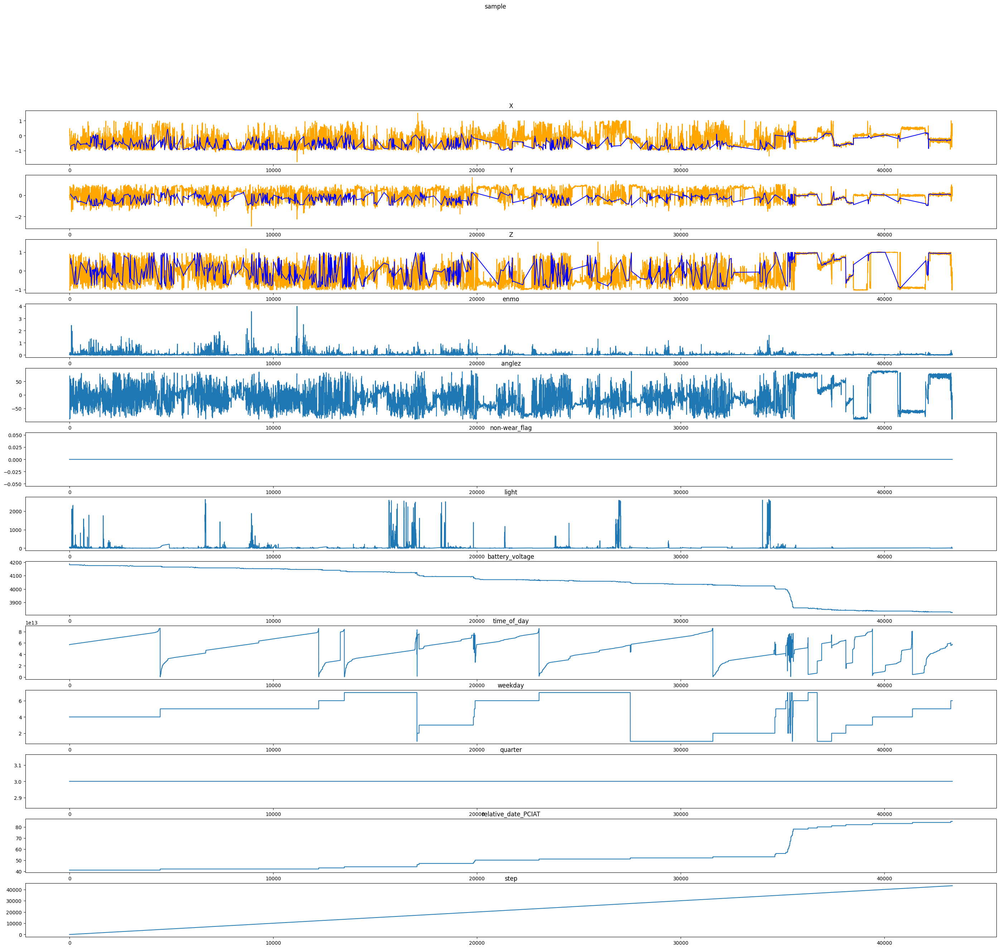

In [11]:
plot_xyz(sample=sample, title="sample")

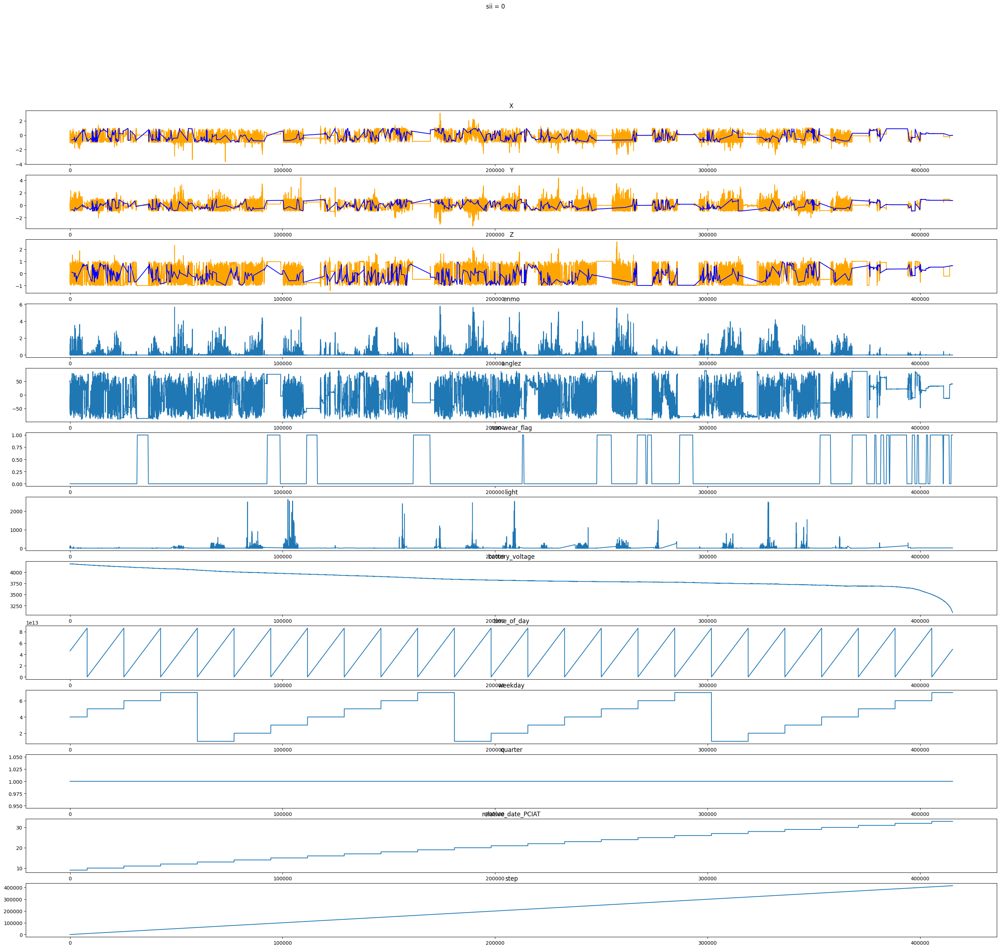

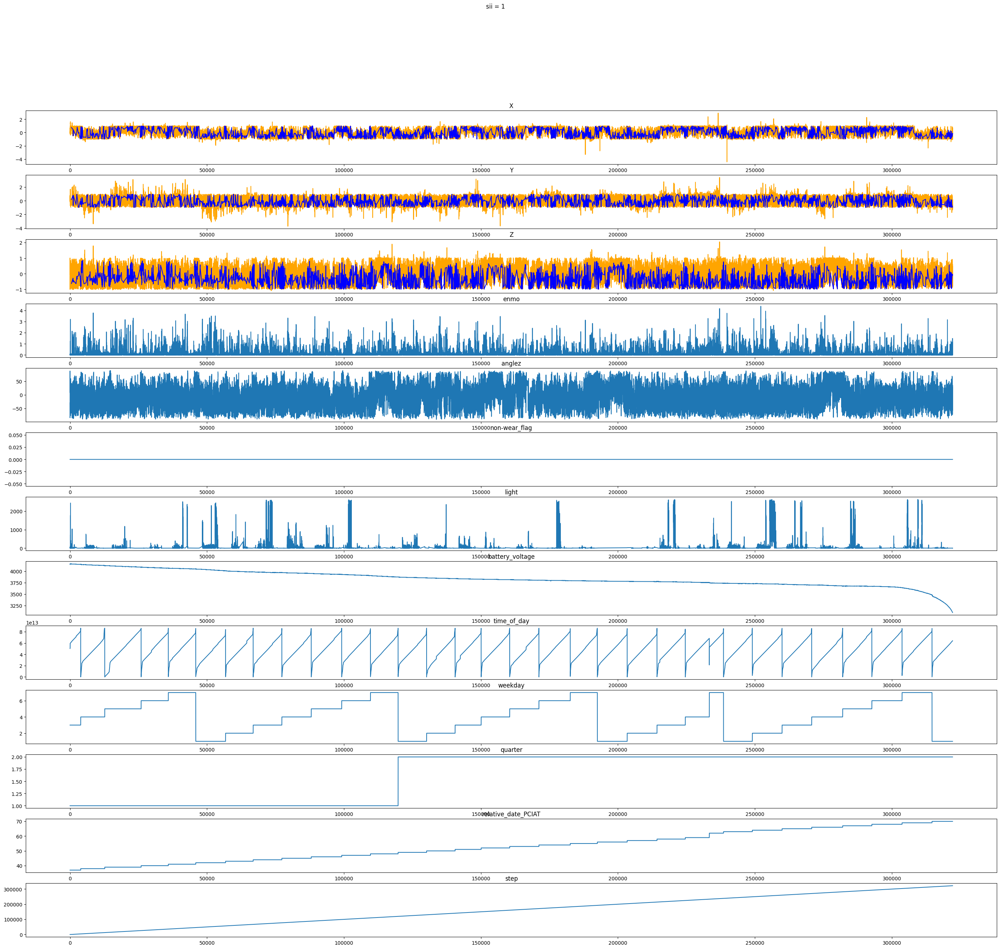

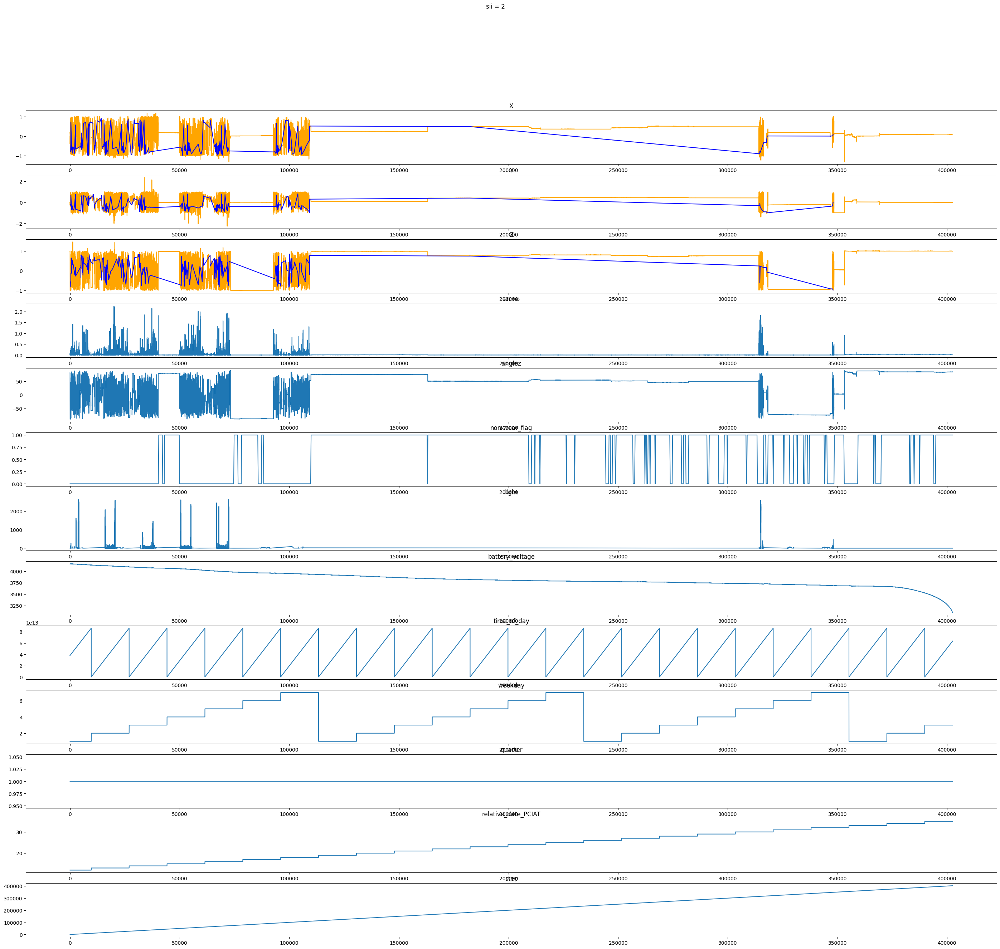

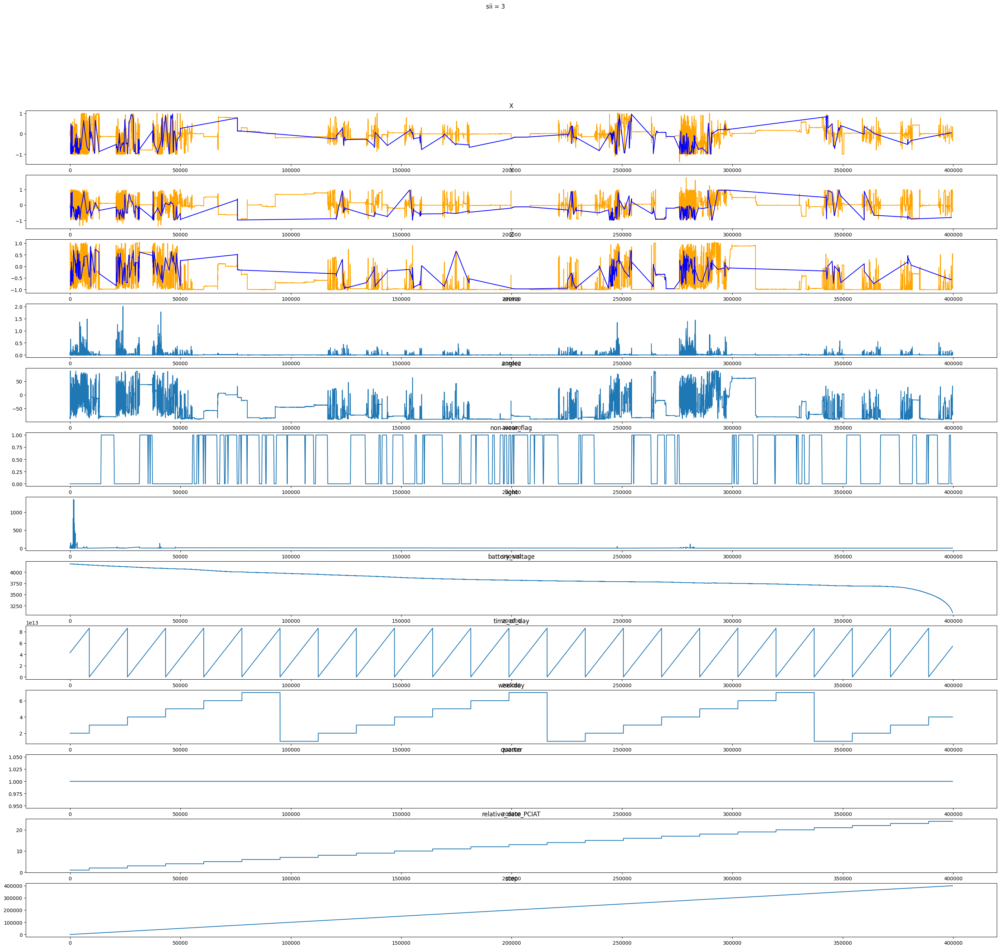

In [12]:
for i in [0, 1, 2, 3]:
    filtered_df = df[df["sii"] == i].sample(1)

    _id = filtered_df["id"].values[0]
    sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
    
    plot_xyz(sample=sample, title=f"sii = {i}")

light mean 82.99697
sii 0.0


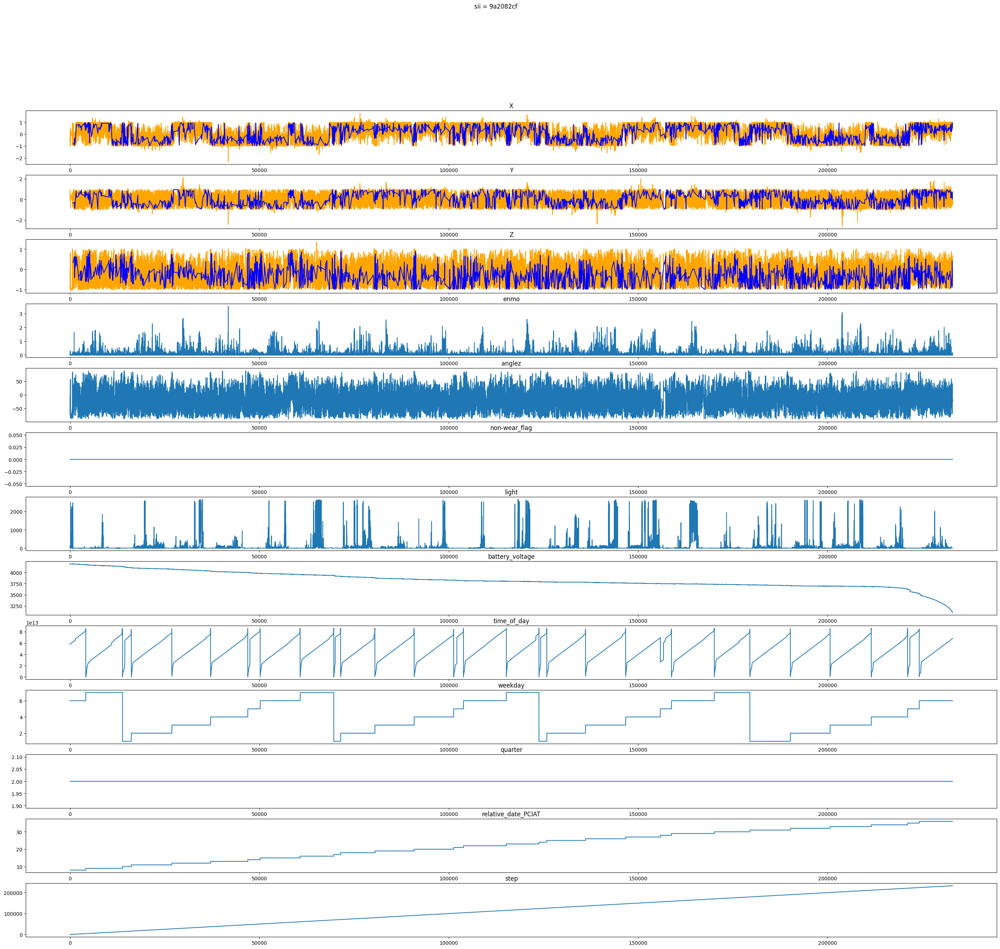

In [13]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

print("light mean", sample["light"].mean())

print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")

36c060b9
light mean 62.2862
sii 2.0


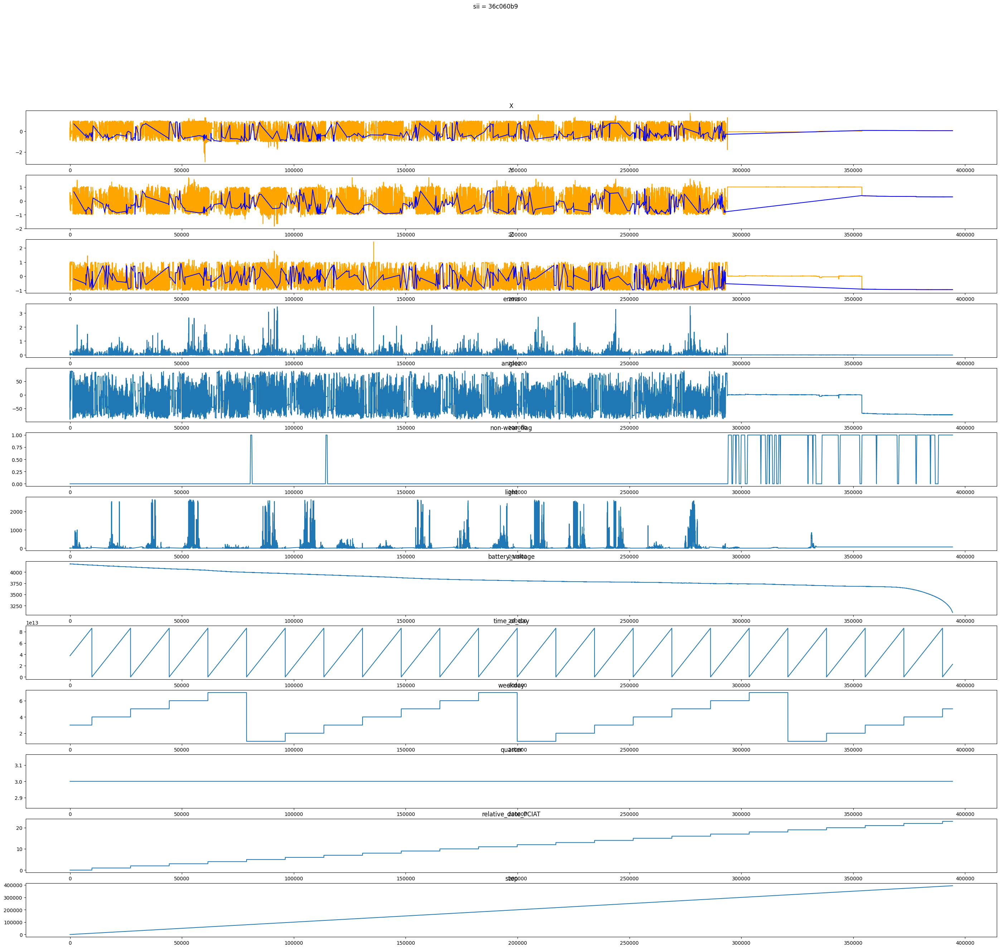

In [14]:
_id = df.sample(1)["id"].values[0]
print(_id)
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

print("light mean", sample["light"].mean())

print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")

Illuminance (lux)	Surfaces illuminated by  
0.0001	Moonless, overcast night sky (starlight)[5]  
0.002	Moonless clear night sky with airglow[5]  
0.05–0.3	Full moon on a clear night[6]  
3.4	Dark limit of civil twilight under a clear sky[7]  
20–50	Public areas with dark surroundings[8]  
50	Family living room lights (Australia, 1998)[9]  
80	Office building hallway/toilet lighting[10][11]  
100	Very dark overcast day[5]  
150	Train station platforms[12]  
320–500	Office lighting[9][13][14][15]  
400	Sunrise or sunset on a clear day.  
1000	Overcast day;[5] typical TV studio lighting  
10,000–25,000	Full daylight (not direct sun)[5]  
32,000–100,000	Direct sunlight  
  
#https://actigraphcorp.my.site.com/support/s/article/Lux-Measurements  
  
#luxでびん幅を決める  

In [15]:
def filter_by_non_wear_flag(sample):
    return sample[sample["non-wear_flag"]==0]

In [16]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.260345,0.354507,-0.371002,3.845420e-02,-36.000080,0.0,7.200000,4182.000000,37560000000000,3,3,0.0
1,1,-0.012609,-0.011124,-1.002550,3.034783e-03,-88.994965,0.0,4.400000,4182.250000,37565000000000,3,3,0.0
2,2,-0.012193,-0.010435,-1.001732,2.661975e-03,-89.055428,0.0,8.500000,4182.500000,37570000000000,3,3,0.0
3,3,-0.013454,-0.010032,-1.001694,2.856894e-03,-89.078545,0.0,8.000000,4182.750000,37575000000000,3,3,0.0
4,4,0.336200,0.227880,-0.742464,6.332472e-02,-55.559845,0.0,7.666667,4183.000000,37580000000000,3,3,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
394423,394423,0.064364,0.290713,-0.943461,0.000000e+00,-72.458687,1.0,66.000000,3098.833252,22475000000000,5,3,23.0
394424,394424,0.063961,0.291102,-0.943357,1.704693e-07,-72.411316,1.0,66.000000,3098.666748,22480000000000,5,3,23.0
394425,394425,0.063727,0.291349,-0.943604,0.000000e+00,-72.415413,1.0,66.000000,3098.500000,22485000000000,5,3,23.0
394426,394426,0.063454,0.291012,-0.943630,0.000000e+00,-72.418831,1.0,66.000000,3098.333252,22490000000000,5,3,23.0


In [17]:
def plot_lux_line(sample):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    sample.light.plot(kind="hist", ax=ax[0])
    sample.light.plot(kind="hist", ax=ax[1])
    
    ax[0].vlines(0.0001, ymin=0, ymax=200000, color="red")
    ax[0].vlines(0.002, ymin=0, ymax=200000, color="red")
    ax[0].vlines(0.05, ymin=0, ymax=200000, color="red")
    ax[0].vlines(0.3, ymin=0, ymax=200000, color="red")
    ax[0].vlines(3.4, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(20, ymin=0, ymax=200000, color="red")
    ax[0].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(80, ymin=0, ymax=200000, color="red")
    ax[0].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(100, ymin=0, ymax=200000, color="red")
    ax[0].vlines(150, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(320, ymin=0, ymax=200000, color="red")
    ax[0].vlines(500, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(400, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(1000, ymin=0, ymax=200000, color="red")
    
    # ax[0].vlines(32000, ymin=0, ymax=200000, color="red")
    # ax[0].vlines(100000, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(0.0001, ymin=0, ymax=200000, color="red")
    ax[1].vlines(0.002, ymin=0, ymax=200000, color="red")
    ax[1].vlines(0.05, ymin=0, ymax=200000, color="red")
    ax[1].vlines(0.3, ymin=0, ymax=200000, color="red")
    ax[1].vlines(3.4, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(20, ymin=0, ymax=200000, color="red")
    ax[1].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(80, ymin=0, ymax=200000, color="red")
    ax[1].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(100, ymin=0, ymax=200000, color="red")
    ax[1].vlines(150, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(320, ymin=0, ymax=200000, color="red")
    ax[1].vlines(500, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(400, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(1000, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(32000, ymin=0, ymax=200000, color="red")
    ax[1].vlines(100000, ymin=0, ymax=200000, color="red")

light mean 11.641819
sii 0.0


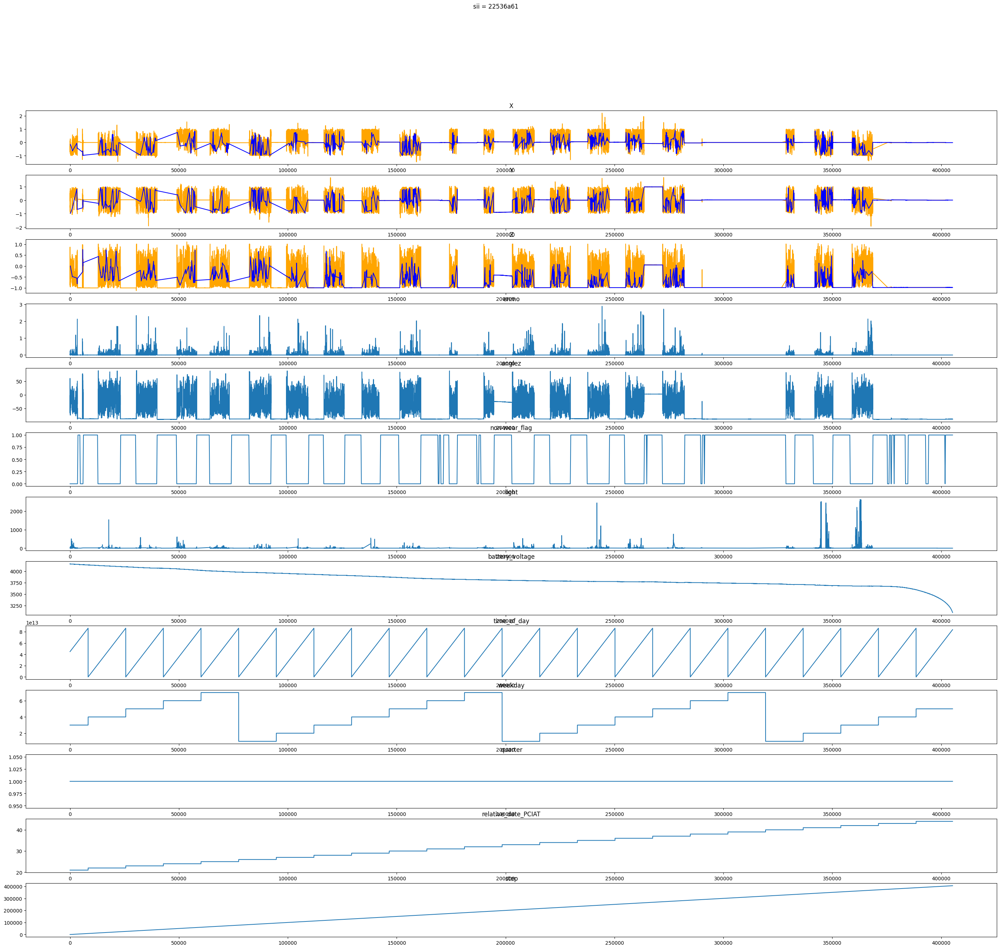

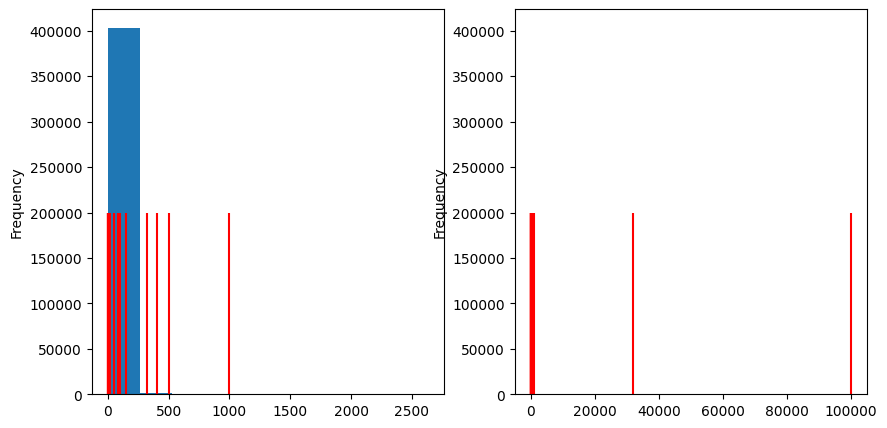

In [18]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 12.795805
sii 1.0


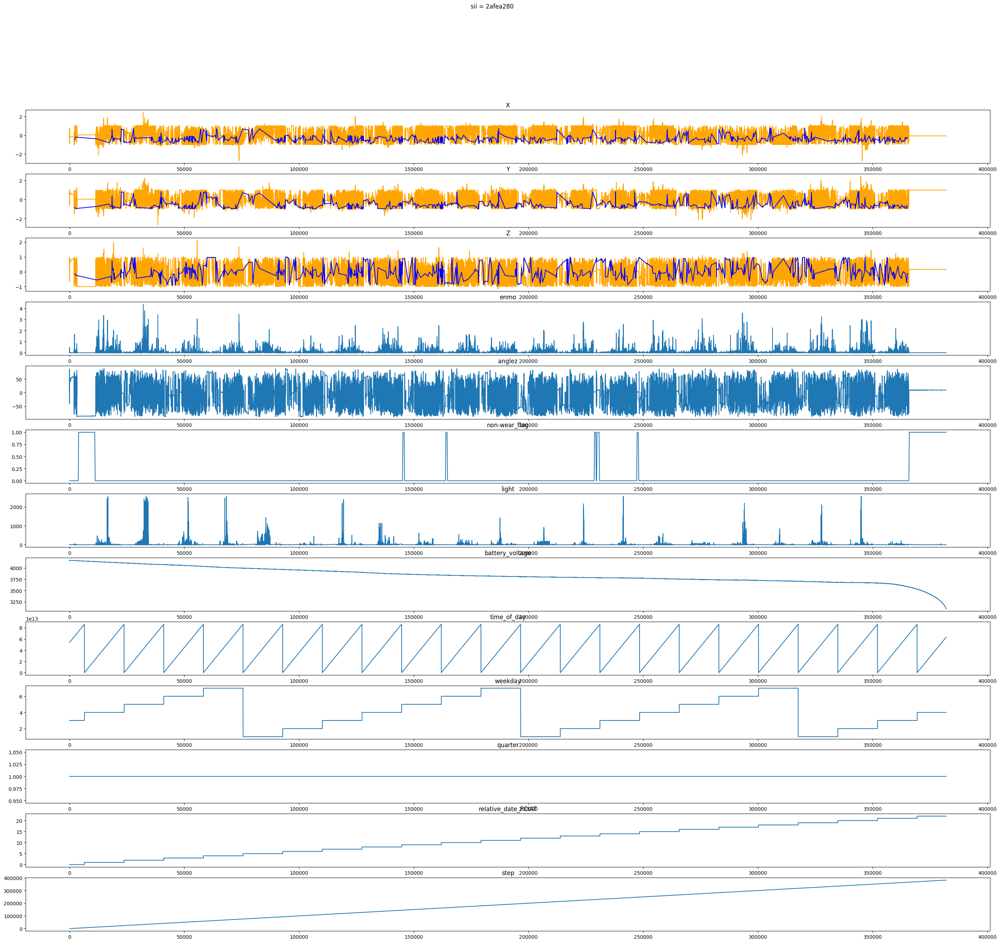

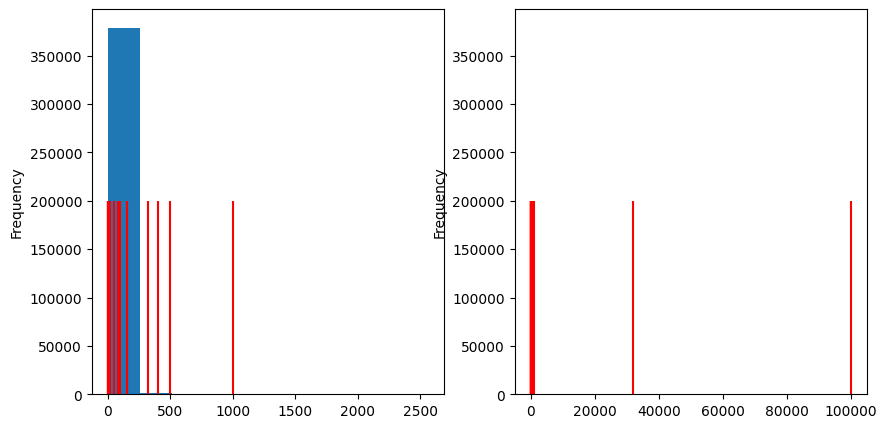

In [19]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 195.06142
sii 0.0


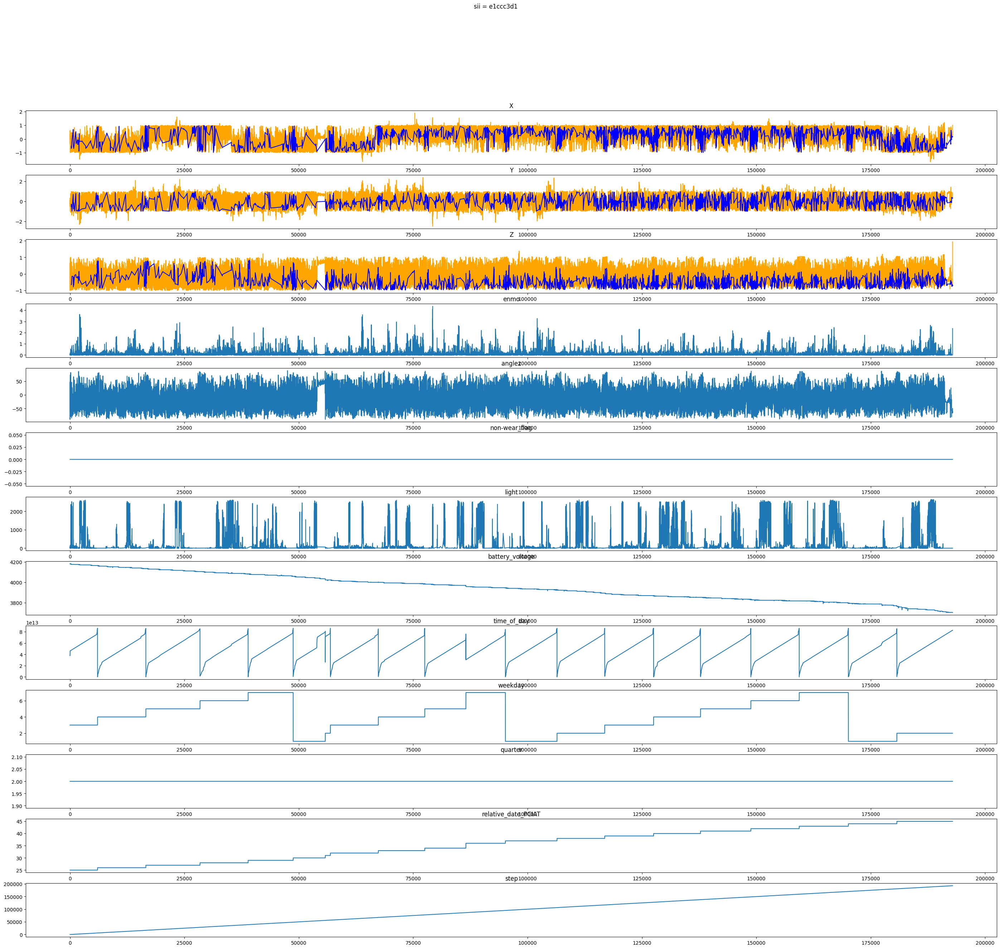

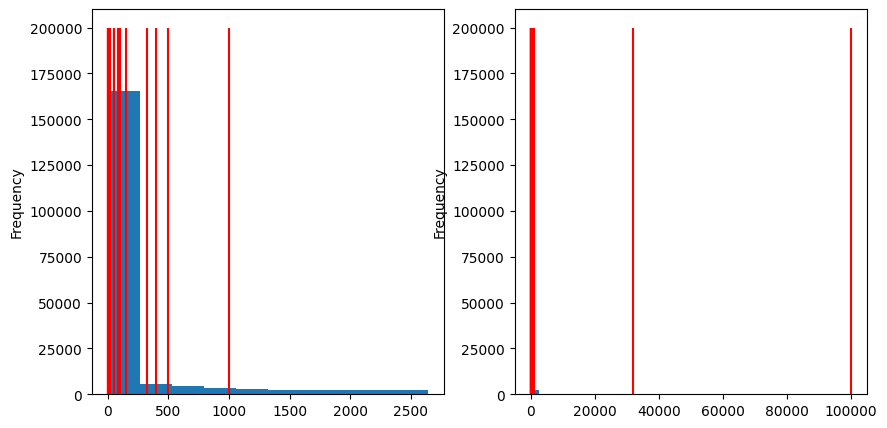

In [20]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 49.98928
sii 0.0


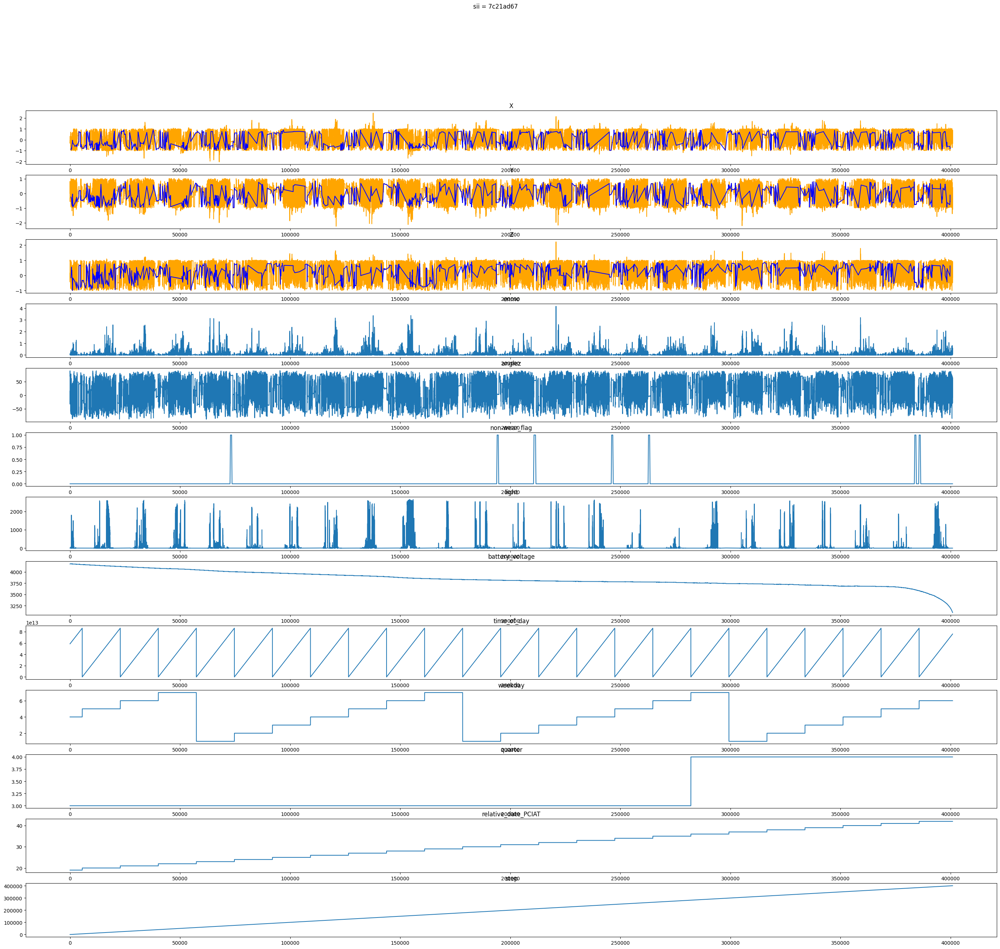

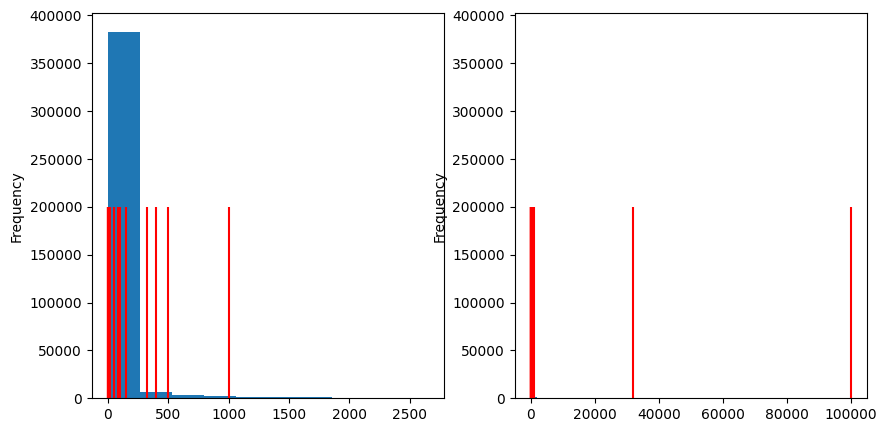

In [21]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 34.27213
sii 1.0


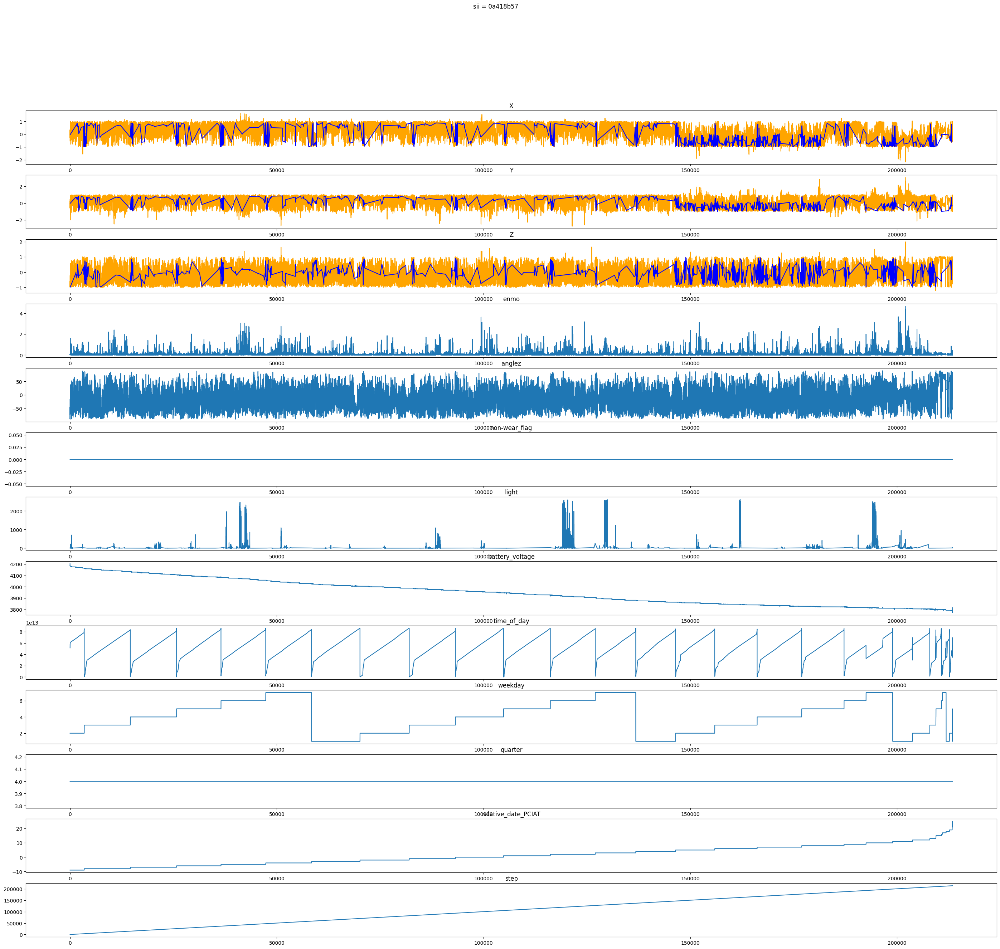

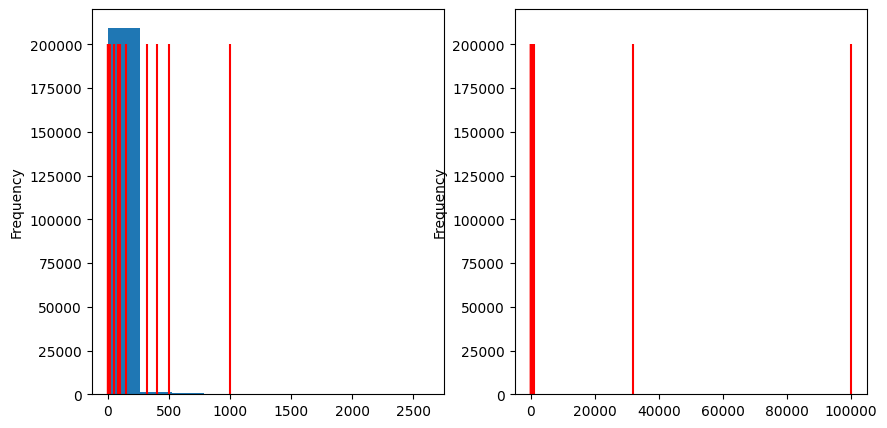

In [22]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 5.5731335
sii 0.0


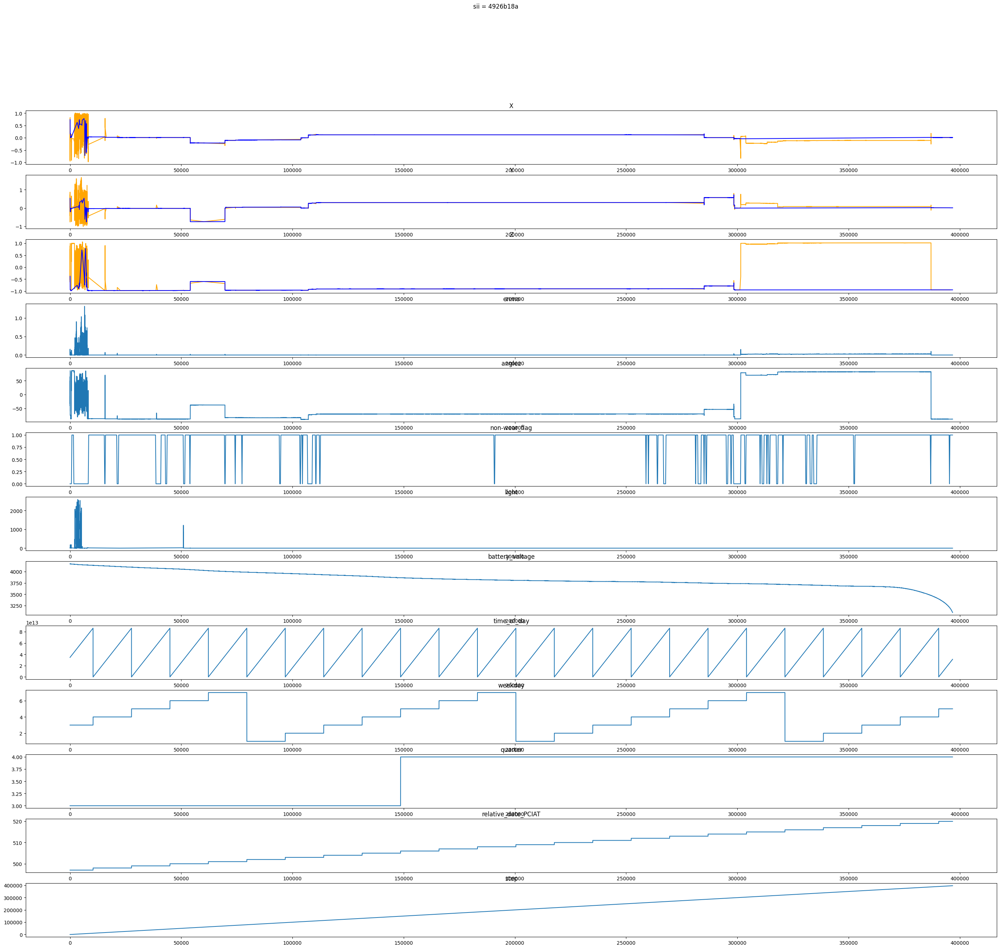

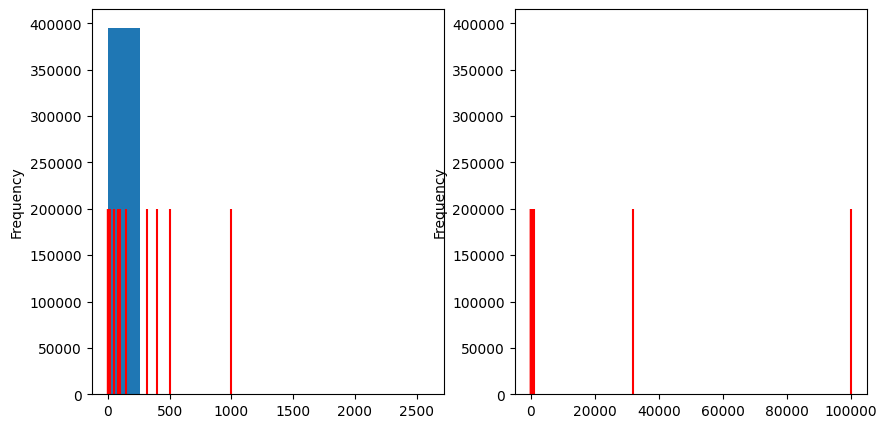

In [23]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 51.711254
sii 1.0


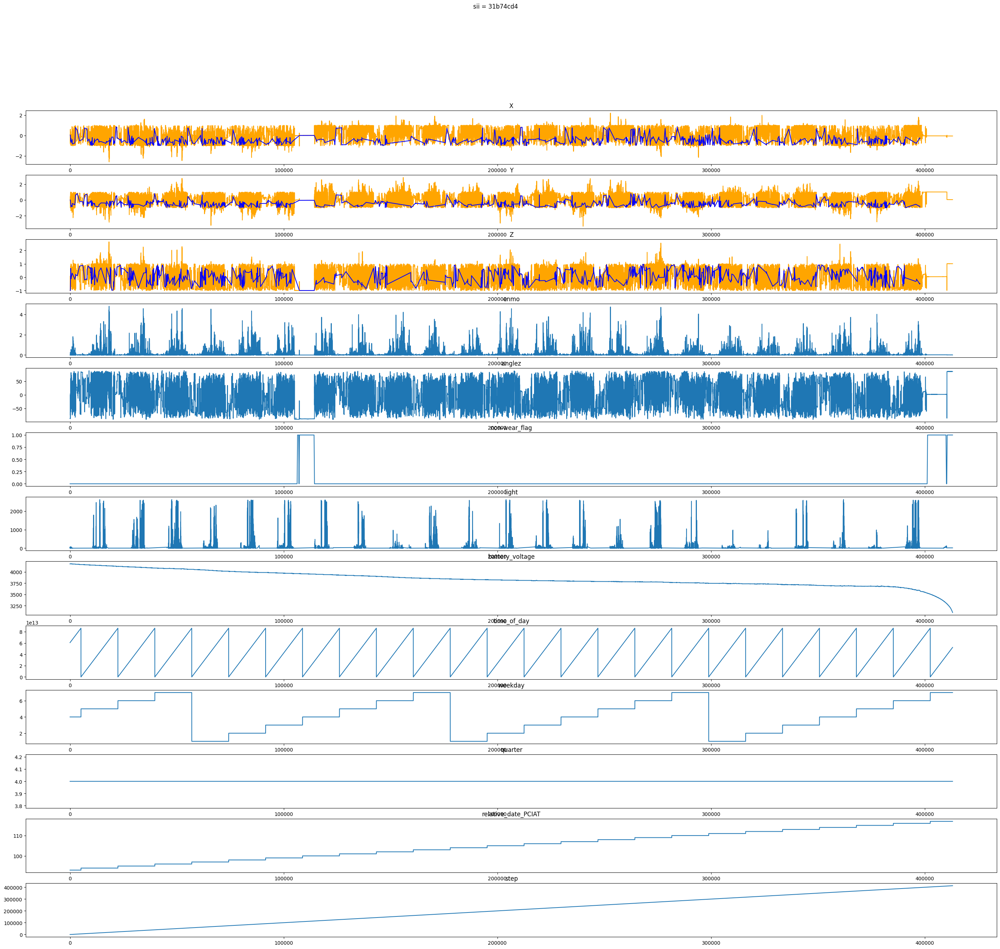

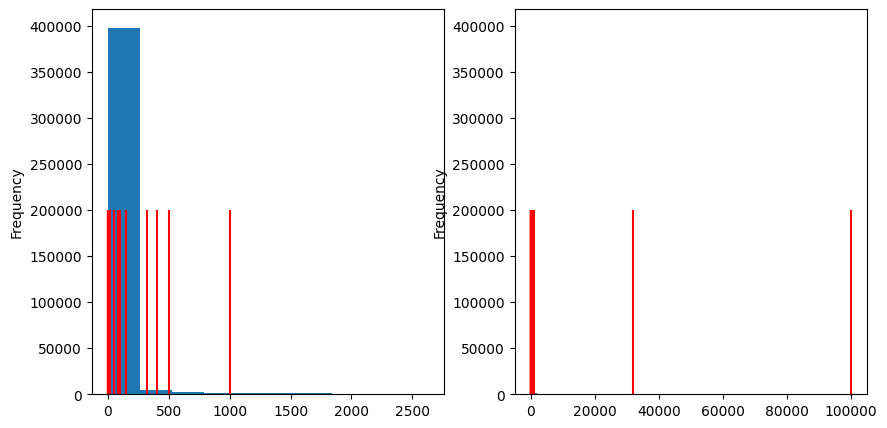

In [24]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 74.71399
sii 0.0


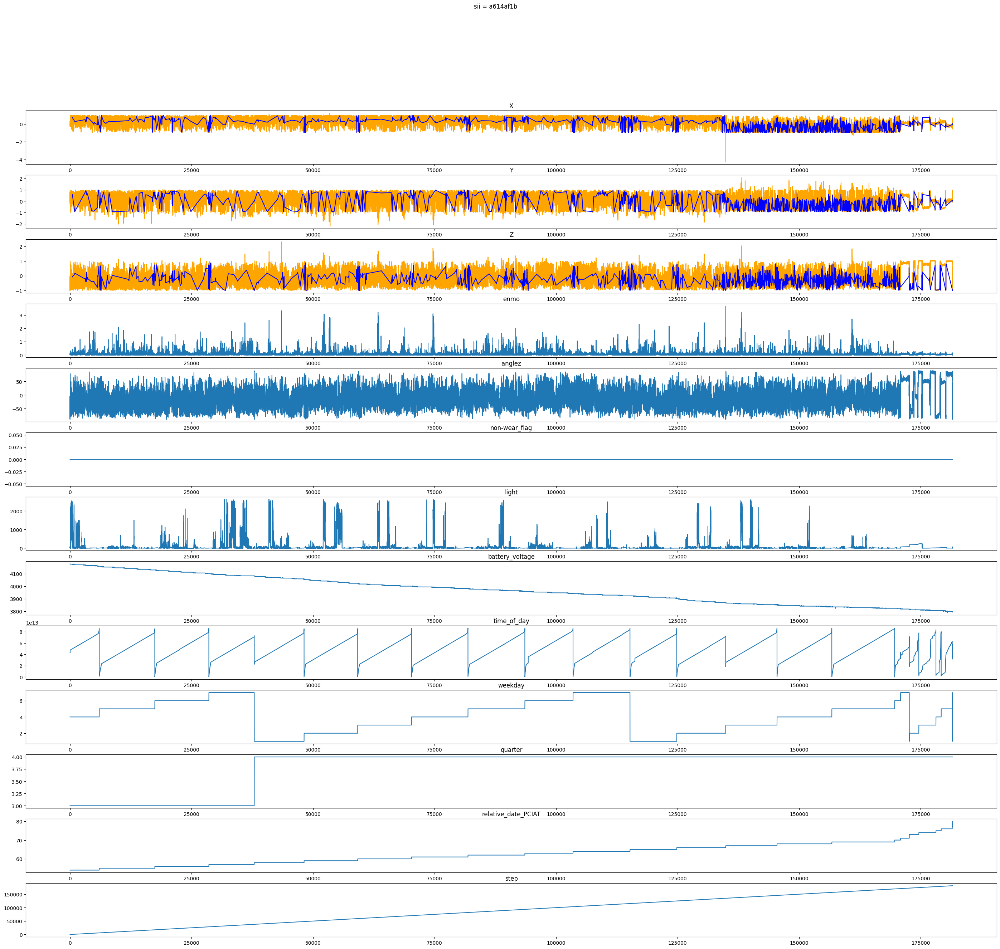

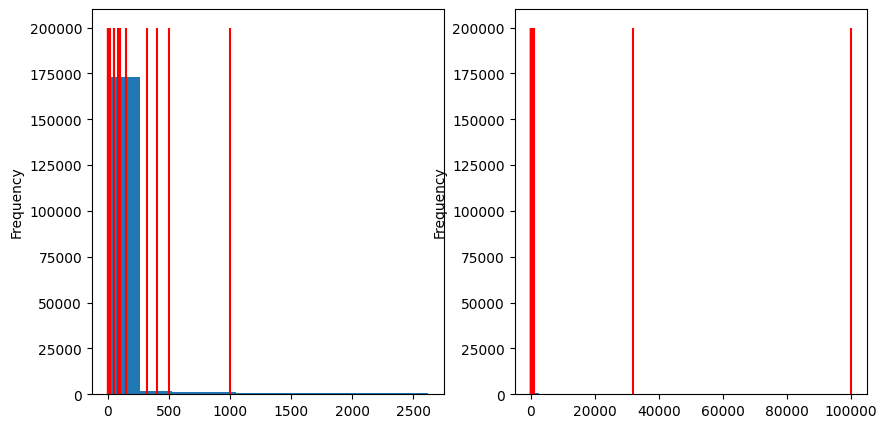

In [25]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

In [26]:
df["sii"].value_counts()

sii
0.0    583
1.0    266
2.0    137
3.0     10
Name: count, dtype: int64

In [27]:
train_df = pd.read_csv("../input/train.csv")
train_df["sii"].value_counts()

sii
0.0    1594
1.0     730
2.0     378
3.0      34
Name: count, dtype: int64

In [28]:
sample.light.value_counts().sort_index()

light
0.000000       2204
0.000454          1
0.000908          1
0.001037          1
0.001265          1
               ... 
2613.000000       1
2616.600098       1
2616.800049       1
2619.600098       1
2622.000000       1
Name: count, Length: 80603, dtype: int64

In [29]:
partitions = [
    0.0001,
    0.002,
    0.05, #Full moon on a clear night[6]
    0.3,  #Full moon on a clear night[6]
    3.4,  #Dark limit of civil twilight under a clear sky[7]
    20, #Public areas with dark surroundings[8]
    #50, #Public areas with dark surroundings[8]
    50, #Family living room lights (Australia, 1998)[9]
    80, #Office building hallway/toilet lighting[10][11]
    100, #Very dark overcast day[5]
    150, #Train station platforms[12]
    320, #Office lighting[9][13][14][15]
    400, #Sunrise or sunset on a clear day.
    500, #Office lighting[9][13][14][15]
    1000, #Overcast day;[5] typical TV studio lighting
    10_000, #Full daylight (not direct sun)[5]
    25_000, #Full daylight (not direct sun)[5]
    32_000,
    100_000 #Direct sunlight
]

In [30]:
sorted(partitions), len(partitions)

([0.0001,
  0.002,
  0.05,
  0.3,
  3.4,
  20,
  50,
  80,
  100,
  150,
  320,
  400,
  500,
  1000,
  10000,
  25000,
  32000,
  100000],
 18)

In [30]:
sorted(partitions), len(partitions)

([0.0001,
  0.002,
  0.05,
  0.3,
  3.4,
  20,
  50,
  80,
  100,
  150,
  320,
  400,
  500,
  1000,
  10000,
  25000,
  32000,
  100000],
 18)

In [31]:
def lux_category(lux_value):
    """
    Illuminance (lux) Surfaces illuminated by
    0.0001 Moonless, overcast night sky (starlight)[5]
    0.002 Moonless clear night sky with airglow[5]
    0.05–0.3 Full moon on a clear night[6]
    3.4 Dark limit of civil twilight under a clear sky[7]
    20–50 Public areas with dark surroundings[8]
    50 Family living room lights (Australia, 1998)[9]
    80 Office building hallway/toilet lighting[10][11]
    100 Very dark overcast day[5]
    150 Train station platforms[12]
    320–500 Office lighting[9][13][14][15]
    400 Sunrise or sunset on a clear day.
    1000 Overcast day;[5] typical TV studio lighting
    10,000–25,000 Full daylight (not direct sun)[5]
    32,000–100,000 Direct sunlight
    """
    partitions = [
    0.0001,
    0.002,
    0.05, #Full moon on a clear night[6]
    0.3,  #Full moon on a clear night[6]
    3.4,  #Dark limit of civil twilight under a clear sky[7]
    20, #Public areas with dark surroundings[8]
    #50, #Public areas with dark surroundings[8]
    50, #Family living room lights (Australia, 1998)[9]
    80, #Office building hallway/toilet lighting[10][11]
    100, #Very dark overcast day[5]
    150, #Train station platforms[12]
    320, #Office lighting[9][13][14][15]
    400, #Sunrise or sunset on a clear day.
    500, #Office lighting[9][13][14][15]
    1000, #Overcast day;[5] typical TV studio lighting
    10_000, #Full daylight (not direct sun)[5]
    25_000, #Full daylight (not direct sun)[5]
    32_000,
    100_000 #Direct sunlight
    ]
    for i, p in enumerate(partitions):
        if lux_value <= p:
            return i
    return len(partitions)

In [32]:
lux_data = pd.DataFrame({"lux":partitions+[1000_000]})
lux_data["category"] = lux_data.lux.apply(lambda x: lux_category(x))
lux_data

,lux,category
0,0.0001,0
1,0.0020,1
2,0.0500,2
3,0.3000,3
4,3.4000,4
5,20.0000,5
6,50.0000,6
7,80.0000,7
8,100.0000,8
9,150.0000,9


In [33]:
sample["lux_category"] = sample["light"].apply(lambda x: lux_category(x))

In [34]:
def plot_xyz(sample, title):
    fig, ax = plt.subplots(2, 1, figsize=(10, 15))
    
    ax[0].plot(sample["light"])
    ax[0].set_title("light")

    ax[1].plot(sample["lux_category"])
    ax[1].set_title("lux_category")
    
    fig.suptitle(title)
    plt.show()

In [35]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,lux_category
0,0,0.014181,-0.015162,-0.997784,1.196404e-03,-88.854126,0.0,99.000000,4176.000000,42660000000000,4,3,54.0,8
1,1,0.014618,-0.015493,-0.997185,9.136629e-04,-88.764236,0.0,69.500000,4176.166504,42665000000000,4,3,54.0,7
2,2,-0.253438,0.556795,-0.121061,1.647441e-01,-25.589375,0.0,10.500000,4176.500000,42675000000000,4,3,54.0,5
3,3,-0.057441,0.789993,-0.122989,4.238855e-02,-5.020122,0.0,13.600000,4176.666504,42680000000000,4,3,54.0,5
4,4,0.272057,0.429787,-0.000213,3.327405e-02,-5.201641,0.0,6.666667,4176.833496,42685000000000,4,3,54.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181571,181571,0.008577,0.018578,-0.983459,0.000000e+00,-88.872620,0.0,37.200001,3794.000000,49560000000000,2,4,80.0,6
181572,181572,0.009682,0.017993,-0.983928,0.000000e+00,-88.923393,0.0,29.000000,3794.000000,49565000000000,2,4,80.0,6
181573,181573,0.008191,0.014739,-0.980516,5.954925e-04,-89.087723,0.0,41.000000,3794.000000,49650000000000,2,4,80.0,6
181574,181574,0.007600,0.014027,-0.983537,1.279513e-07,-89.100494,0.0,42.142857,3794.000000,49655000000000,2,4,80.0,6


light mean 105.31755
sii 1.0


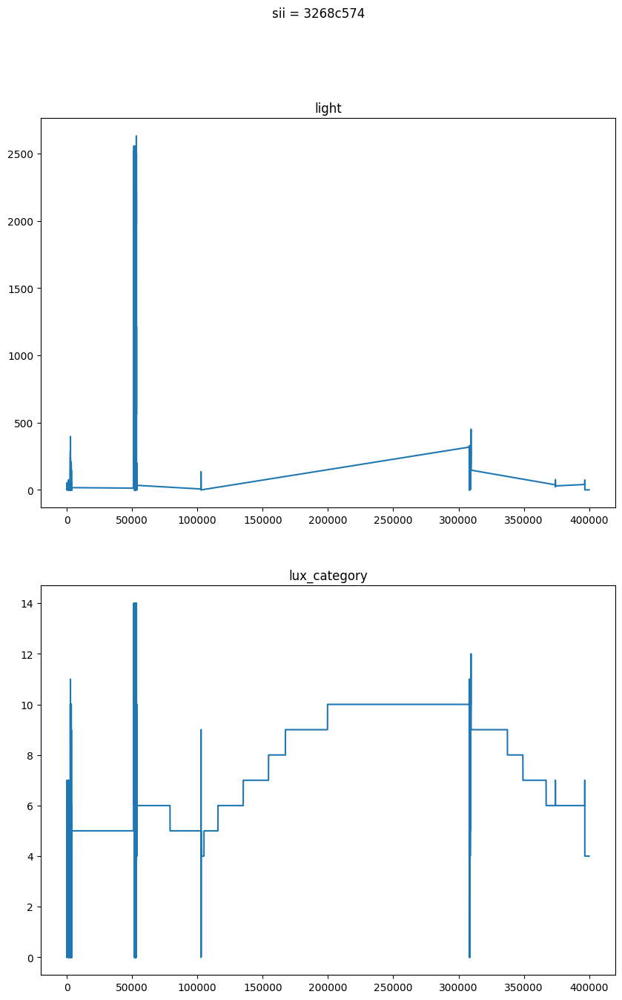

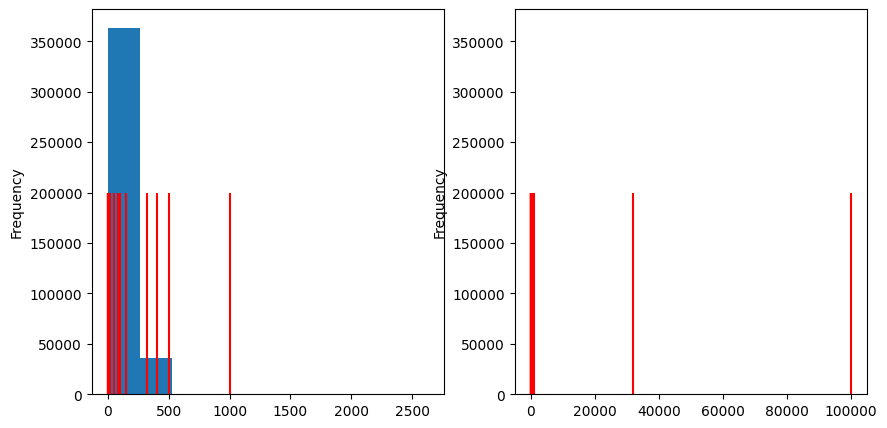

In [36]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

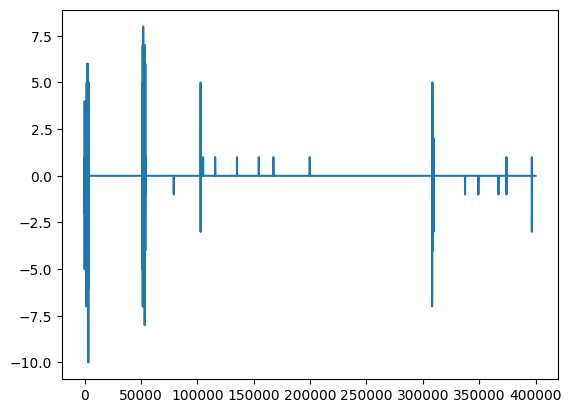

In [37]:
plt.plot(sample["lux_category"].diff().fillna(0))

In [38]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,lux_category
0,0,0.753366,-0.446335,-0.483097,0.049392,-28.591660,0.0,5.000000,4193.000000,52980000000000,1,3,7.0,5
1,1,0.503458,0.325222,-0.774189,0.076669,-50.857956,0.0,0.000000,4192.666504,52985000000000,1,3,7.0,0
2,2,0.352026,0.310315,-0.867408,0.050029,-60.712543,0.0,0.100000,4192.333496,52990000000000,1,3,7.0,3
3,3,0.127168,0.253359,-0.925009,0.057983,-68.236229,0.0,0.200000,4192.000000,52995000000000,1,3,7.0,3
4,4,-0.016811,0.307141,-0.957877,0.009440,-71.938049,0.0,0.300000,4191.666504,53000000000000,1,3,7.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399979,399979,0.140769,-0.188326,0.961776,0.000000,76.204285,1.0,0.333333,3098.833252,65675000000000,3,3,30.0,4
399980,399980,0.140665,-0.188211,0.961698,0.000000,76.204285,1.0,0.333333,3098.666748,65680000000000,3,3,30.0,4
399981,399981,0.140508,-0.188147,0.961828,0.000007,76.204285,1.0,0.333333,3098.500000,65685000000000,3,3,30.0,4
399982,399982,0.140835,-0.188352,0.961437,0.000000,76.204285,1.0,0.333333,3098.333252,65690000000000,3,3,30.0,4


In [39]:
sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))

true_sample = sample[sample["non-wear_flag"] == 0]

true_sample.groupby("lux_category")["enmo"].agg({"mean", "median", "min", "max", "var"}).add_suffix("_enmo").reset_index(drop=False)

,lux_category,min_enmo,max_enmo,mean_enmo,var_enmo,median_enmo
0,0,0.000000,0.243124,0.045199,0.002634,0.024823
1,2,0.000349,0.134898,0.046037,0.002006,0.033276
2,3,0.000059,0.166374,0.025769,0.000763,0.019580
3,4,0.000000,0.390004,0.014919,0.000767,0.006330
4,5,0.000000,0.800203,0.010309,0.000718,0.001491
5,6,0.000000,2.624825,0.011134,0.000946,0.002235
6,7,0.000000,0.353269,0.015843,0.000403,0.008073
7,8,0.000000,0.288582,0.019231,0.000460,0.009952
8,9,0.000000,0.701767,0.016851,0.000516,0.010300
9,10,0.000000,0.396407,0.020261,0.000563,0.017396


light mean 11.188502
sii 0.0


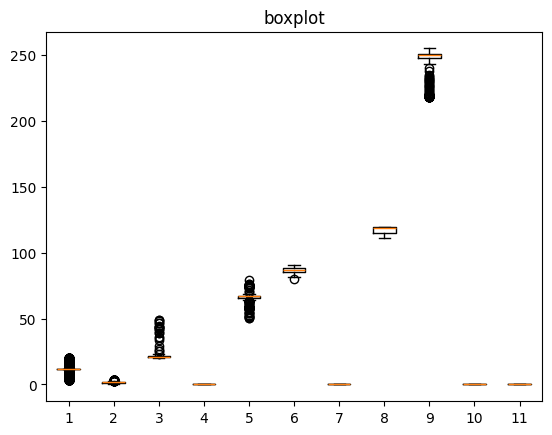

In [40]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 59.64506
sii 2.0


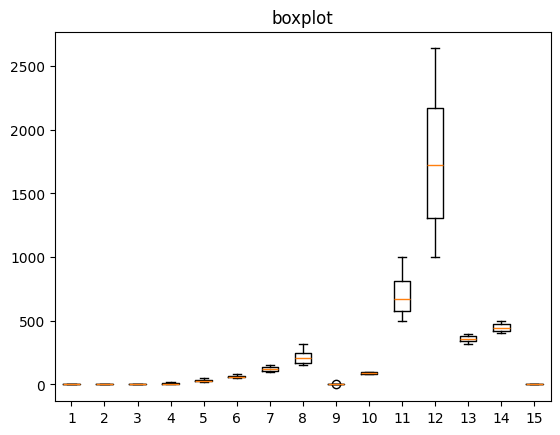

In [41]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 25.377674
sii 1.0


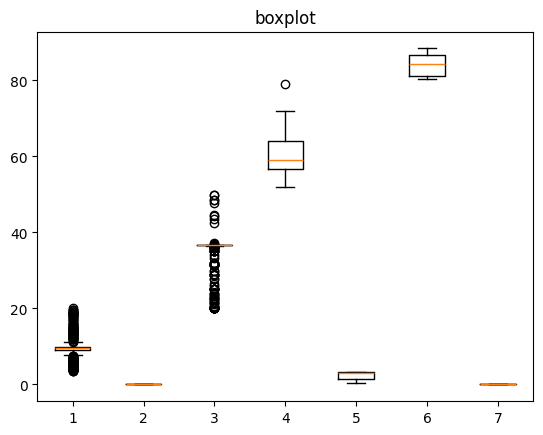

In [42]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 17.07419
sii 1.0


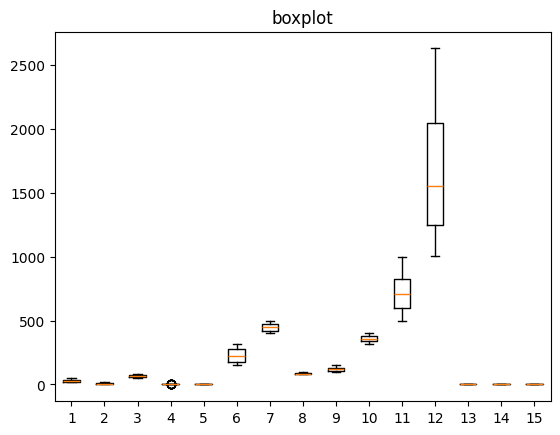

In [43]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 37.28691
sii 2.0


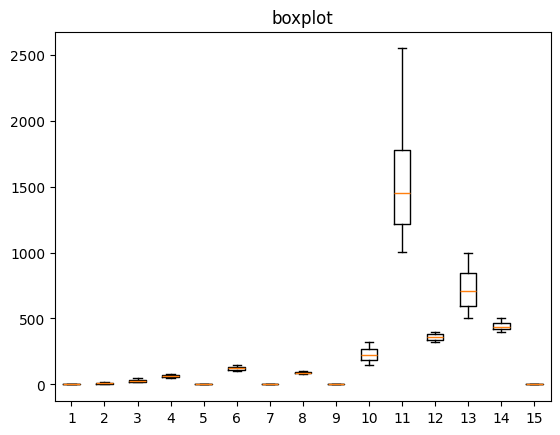

In [44]:
_id = df[df["sii"]==2].sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 75.6057
sii 3.0


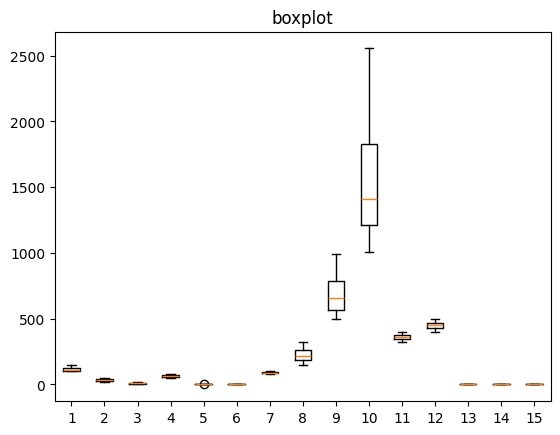

In [45]:
_id = df[df["sii"]==3].sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

In [46]:
true_sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,lux_category
0,0,0.005625,-0.003177,-1.019609,0.019643,-89.689552,0.0,127.000000,4184.000000,58560000000000,6,2,7.0,9
1,1,0.005234,-0.003359,-1.018906,0.018935,-89.654556,0.0,129.500000,4183.750000,58565000000000,6,2,7.0,9
2,2,-0.413542,0.057396,-0.503255,0.062583,-52.282402,0.0,39.799999,4182.333496,58720000000000,6,2,7.0,6
3,3,-0.313125,-0.510104,0.023177,0.043816,5.392189,0.0,8.500000,4182.750000,58725000000000,6,2,7.0,5
4,4,-0.219141,-0.064167,-0.405052,0.045096,-39.001038,0.0,32.333332,4183.166504,58730000000000,6,2,7.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14437,14437,-0.000260,-0.001736,-1.037847,0.038253,-89.918518,0.0,0.500000,4166.962891,39240000000000,2,3,52.0,4
14438,14438,0.000000,-0.001250,-1.034167,0.034179,-89.890282,0.0,7.000000,4167.465820,39245000000000,2,3,52.0,5
14439,14439,-0.000347,-0.001606,-1.030729,0.030741,-89.850418,0.0,8.833333,4167.969238,39250000000000,2,3,52.0,5
14440,14440,-0.476693,0.750130,-0.183138,0.067458,-14.230834,0.0,2.333333,4167.969238,39345000000000,2,3,52.0,4


light mean 7.8783545
sii 1.0


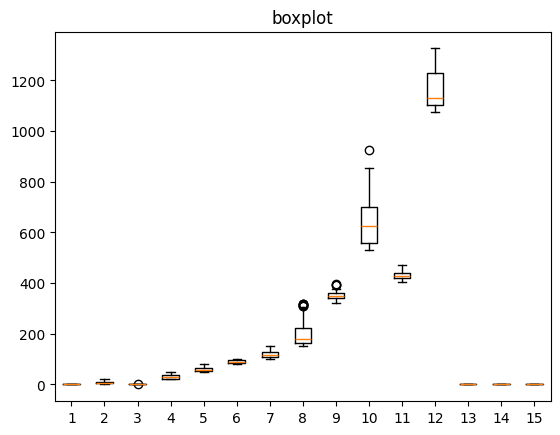

In [47]:
_id = df[df["sii"]==1].sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

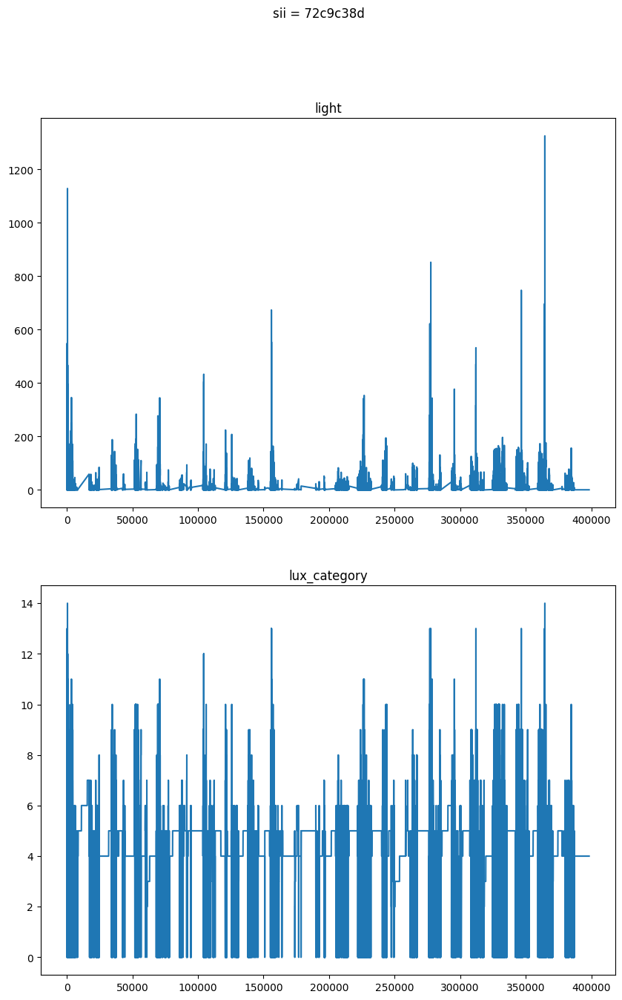

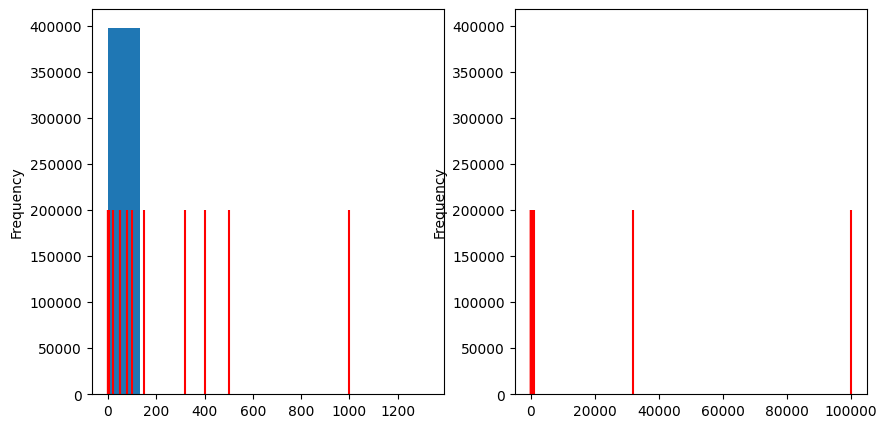

In [48]:
plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

In [49]:
df.columns

Index(['id', 'Basic_Demos-Age', 'Basic_Demos-Sex', 'CGAS-CGAS_Score',
       'Physical-BMI', 'Physical-Height', 'Physical-Weight',
       'Physical-Waist_Circumference', 'Physical-Diastolic_BP',
       'Physical-HeartRate', 'Physical-Systolic_BP',
       'Fitness_Endurance-Max_Stage', 'Fitness_Endurance-Time_Mins',
       'Fitness_Endurance-Time_Sec', 'FGC-FGC_CU', 'FGC-FGC_CU_Zone',
       'FGC-FGC_GSND', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD', 'FGC-FGC_GSD_Zone',
       'FGC-FGC_PU', 'FGC-FGC_PU_Zone', 'FGC-FGC_SRL', 'FGC-FGC_SRL_Zone',
       'FGC-FGC_SRR', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL', 'FGC-FGC_TL_Zone',
       'BIA-BIA_Activity_Level_num', 'BIA-BIA_BMC', 'BIA-BIA_BMI',
       'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM',
       'BIA-BIA_FFMI', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'BIA-BIA_Frame_num',
       'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_LST', 'BIA-BIA_SMM',
       'BIA-BIA_TBW', 'PAQ_A-PAQ_A_Total', 'PAQ_C-PAQ_C_Total',
       'PCIAT-PCIAT_01', 'PCIAT-PCIAT_02', 'P

In [50]:
df[df["sii"]==0]["id"]

3      01085eb3
4      012cadd8
5      012e3869
8      02cf7384
9      035c96dd
         ...   
990    fe3cbf02
991    fe9c71d8
992    fecc07d6
993    ff18b749
995    ffed1dd5
Name: id, Length: 583, dtype: object

In [51]:
df[df["sii"]==0]["id"].unique().shape

(583,)

In [52]:
use_columns = ["light", "non-wear_flag", "enmo"]

_id = df[df["sii"]==0]["id"].unique()[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet", columns=use_columns)

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))

agg_smpl = sample.groupby(["lux_category"])["enmo"].agg("mean")

In [53]:
use_columns = ["light", "non-wear_flag", "enmo"]

sii_is_0 = df[df["sii"]==0]["id"].unique()


aggregations = []
for _id in sii_is_0:
    sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet", columns=use_columns)
    sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
    
    agg_smpl = sample.groupby(["lux_category"], as_index=True)["enmo"].agg("mean").reset_index(drop=True)
    agg_smpl["id"] = _id

    aggregations.append(agg_smpl)

In [54]:
sii_is_0_df = pd.concat(aggregations, axis=1).T.reset_index(drop=False).drop("index", axis=1)

In [55]:
sii_is_0_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,id
0,0.084508,0.07096,0.08224,0.038165,0.029802,0.033531,0.031851,0.039373,0.028714,0.031812,0.049425,0.05165,0.050242,0.081297,0.122489,01085eb3
1,0.095979,0.050701,0.066007,0.045877,0.04456,0.058497,0.149486,0.175859,0.19979,0.173206,0.173739,0.215801,0.142197,0.107878,NaN,012cadd8
2,0.123592,0.16667,0.044481,0.022813,0.019351,0.007591,0.008056,0.023129,0.066665,0.072306,0.042695,0.05349,0.132403,0.358432,0.330643,012e3869
3,0.072394,0.026448,0.020897,0.011844,0.01923,0.019543,0.029054,0.041136,0.039529,0.043318,0.085882,0.100589,0.080153,0.114195,0.189554,02cf7384
4,0.000527,0.175151,0.032019,0.03165,0.013824,0.003262,0.00137,0.051095,0.077805,0.041127,0.100759,0.187066,0.249433,0.292052,0.287695,035c96dd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,0.117744,0.08067,0.062892,0.070342,0.044604,0.060789,0.072157,0.108531,0.085209,0.231034,0.208579,0.420175,0.475958,NaN,NaN,fe3cbf02
579,0.065346,0.006896,0.017881,0.029513,0.037949,0.044438,0.086287,0.102194,0.107187,0.109115,0.102512,0.102808,0.115482,0.078719,0.082492,fe9c71d8
580,0.001711,0.002545,0.002548,0.002553,0.002853,0.004924,0.00235,0.001687,0.001704,0.004496,0.0023,NaN,NaN,NaN,NaN,fecc07d6
581,0.08118,0.087355,0.066041,0.047014,0.025507,0.042056,0.055106,0.066489,0.071655,0.074749,0.122778,0.155188,0.165618,0.205406,0.253975,ff18b749


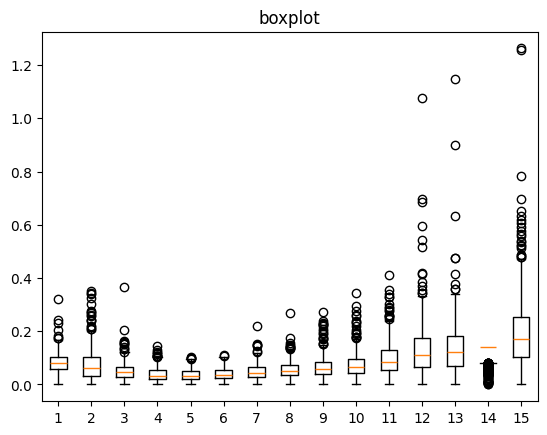

In [56]:
cat = sii_is_0_df.drop("id", axis=1).columns
boxes = []
for i in cat:
    box = sii_is_0_df[i]
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

In [57]:
def get_samples_sii(sii_num):
    use_columns = ["light", "non-wear_flag", "enmo"]
    sii_is_num = df[df["sii"]==sii_num]["id"].unique()
    aggregations = []
    for _id in sii_is_num:
        sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet", columns=use_columns)
        sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
        agg_smpl = sample.groupby(["lux_category"], as_index=True)["enmo"].agg("mean").reset_index(drop=True)
        agg_smpl["id"] = _id
        aggregations.append(agg_smpl)

    return pd.concat(aggregations, axis=1).T.reset_index(drop=False).drop("index", axis=1)

In [58]:
sii_is_1_df = get_samples_sii(sii_num=1)
sii_is_1_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,id
0,0.096096,0.040544,0.031326,0.025463,0.043832,0.041978,0.066678,0.043834,0.066607,0.061333,0.054205,0.074828,0.115012,0.117323,0.182723,00115b9f
1,0.035166,0.022335,0.011244,0.009321,0.010322,0.012728,0.017794,0.014685,0.013459,0.012985,0.029378,0.06049,0.073456,0.091955,0.106463,001f3379
2,0.077231,0.034291,0.029155,0.034137,0.025327,0.024918,0.023639,0.031617,0.039082,0.028006,0.068771,0.109858,0.14006,0.179893,0.097041,00f332d1
3,0.056646,0.047602,0.035349,0.02032,0.022967,0.025428,0.028404,0.046557,0.043463,0.043287,0.034687,0.031982,0.042168,0.062296,0.070909,029a19c9
4,0.056134,0.000277,0.005834,0.010961,0.013874,0.01416,0.01043,0.016999,0.019266,0.033825,0.037256,0.030036,0.032904,0.046481,0.195141,02cebf33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,0.10057,0.03197,0.04884,0.042924,0.049966,0.045638,0.063811,0.085173,0.10025,0.088474,0.10436,0.14302,0.172238,0.132714,0.383484,f9334e08
262,0.05384,0.060903,0.020277,0.016528,0.020738,0.018829,0.022247,0.018255,0.031426,0.047476,0.076598,0.101223,0.121814,0.119105,0.101227,f9384fa2
263,0.066058,0.03066,0.009471,0.005373,0.006157,0.004361,0.025396,0.032134,0.037118,0.081829,0.058611,NaN,NaN,NaN,NaN,fa34f945
264,0.078694,0.102078,0.078096,0.049366,0.046915,0.044521,0.053346,0.048496,0.067512,0.078737,0.088482,0.140548,0.122839,0.174099,0.24536,fdea7d9e


In [59]:
def make_box_plot(input_df, title, ax):
    cat = input_df.drop("id", axis=1).columns
    boxes = []
    for i in cat:
        box = input_df[i]
        boxes.append(box) 
        
    ax.boxplot(boxes)
    ax.set_title(title)
    return ax

In [60]:
sii_is_2_df = get_samples_sii(sii_num=2)
sii_is_3_df = get_samples_sii(sii_num=3)

<Axes: title={'center': 'sii is 3: length=10 '}>

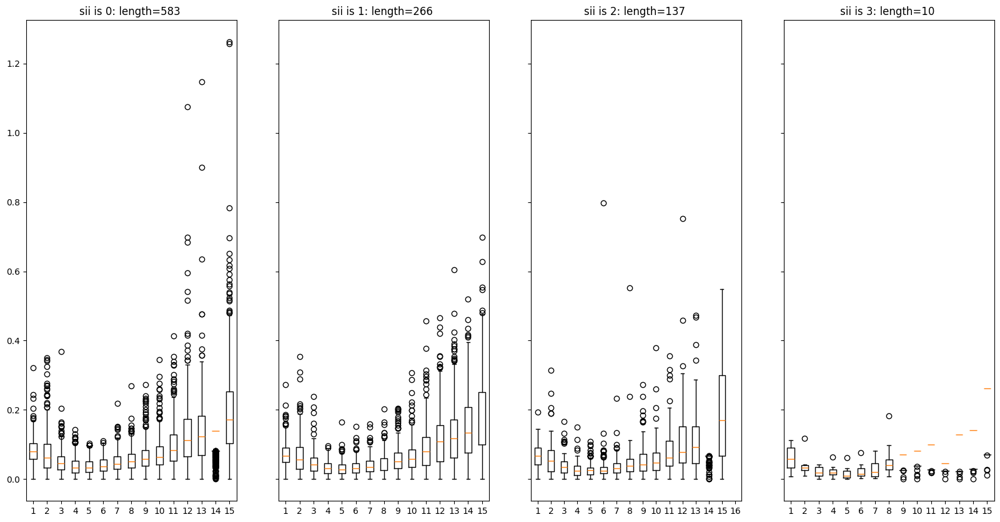

In [70]:
fig, ax = plt.subplots(1,4,figsize=(20,10), sharey=True)

make_box_plot(sii_is_0_df, title="sii is 0: length={} ".format(len(sii_is_0_df)), ax=ax[0])
make_box_plot(sii_is_1_df, title="sii is 1: length={} ".format(len(sii_is_1_df)), ax=ax[1])
make_box_plot(sii_is_2_df, title="sii is 2: length={} ".format(len(sii_is_2_df)), ax=ax[2])
make_box_plot(sii_is_3_df, title="sii is 3: length={} ".format(len(sii_is_3_df)), ax=ax[3])


In [71]:
sii_is_0_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,id
0,0.084508,0.07096,0.08224,0.038165,0.029802,0.033531,0.031851,0.039373,0.028714,0.031812,0.049425,0.05165,0.050242,0.081297,0.122489,01085eb3
1,0.095979,0.050701,0.066007,0.045877,0.04456,0.058497,0.149486,0.175859,0.19979,0.173206,0.173739,0.215801,0.142197,0.107878,NaN,012cadd8
2,0.123592,0.16667,0.044481,0.022813,0.019351,0.007591,0.008056,0.023129,0.066665,0.072306,0.042695,0.05349,0.132403,0.358432,0.330643,012e3869
3,0.072394,0.026448,0.020897,0.011844,0.01923,0.019543,0.029054,0.041136,0.039529,0.043318,0.085882,0.100589,0.080153,0.114195,0.189554,02cf7384
4,0.000527,0.175151,0.032019,0.03165,0.013824,0.003262,0.00137,0.051095,0.077805,0.041127,0.100759,0.187066,0.249433,0.292052,0.287695,035c96dd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,0.117744,0.08067,0.062892,0.070342,0.044604,0.060789,0.072157,0.108531,0.085209,0.231034,0.208579,0.420175,0.475958,NaN,NaN,fe3cbf02
579,0.065346,0.006896,0.017881,0.029513,0.037949,0.044438,0.086287,0.102194,0.107187,0.109115,0.102512,0.102808,0.115482,0.078719,0.082492,fe9c71d8
580,0.001711,0.002545,0.002548,0.002553,0.002853,0.004924,0.00235,0.001687,0.001704,0.004496,0.0023,NaN,NaN,NaN,NaN,fecc07d6
581,0.08118,0.087355,0.066041,0.047014,0.025507,0.042056,0.055106,0.066489,0.071655,0.074749,0.122778,0.155188,0.165618,0.205406,0.253975,ff18b749
